In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

In [11]:
with np.load('./cache/real_plane_complex.npz') as render_data:
    dico_renders = dict(render_data.items())
    
imgs = dico_renders['renders']
imgs[imgs<0.0] = 0.0
imgs[imgs>1.0] = 1.0
settings = dico_renders['settings']

'''
with np.load('./cache/real_monkey_complex.npz') as render_data:
    dico_renders = dict(render_data.items())
    
imgs_plane = dico_renders['renders']
imgs_plane[imgs_plane<0.0] = 0.0
imgs_plane[imgs_plane>1.0] = 1.0
'''

with np.load('./cache/x_real_complex.npz') as render_data:
    dico_renders = dict(render_data.items())
    
x_real_rgb = dico_renders['x_real_rgb']
x_real_rough = dico_renders['x_real_rough']
x_real_scale = dico_renders['x_real_scale']

print('Renders shape: ', imgs.shape)
print('Settings shape: ', settings.shape)

Renders shape:  (23, 256, 256, 4)
Settings shape:  (23, 6)


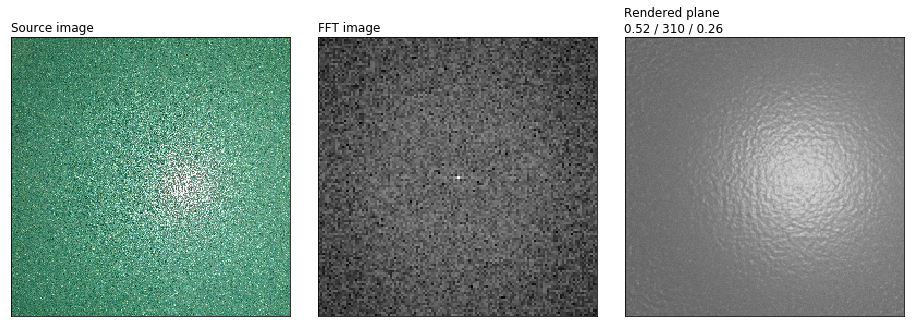

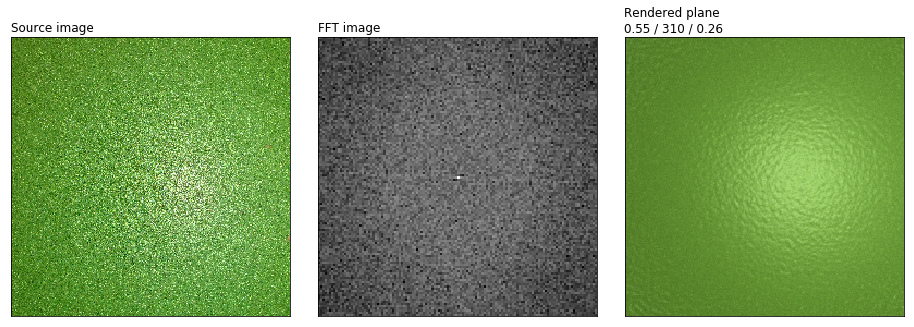

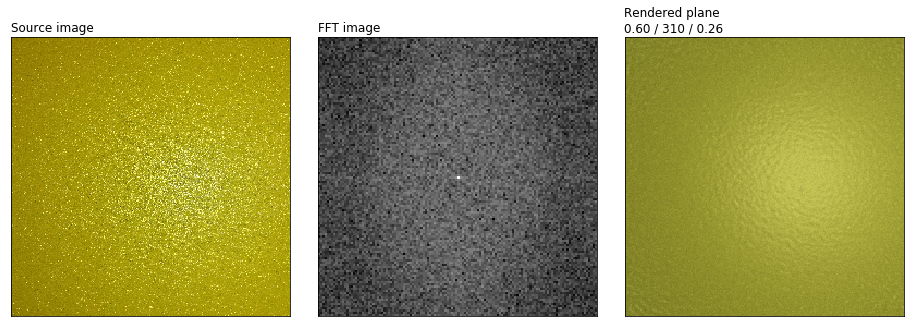

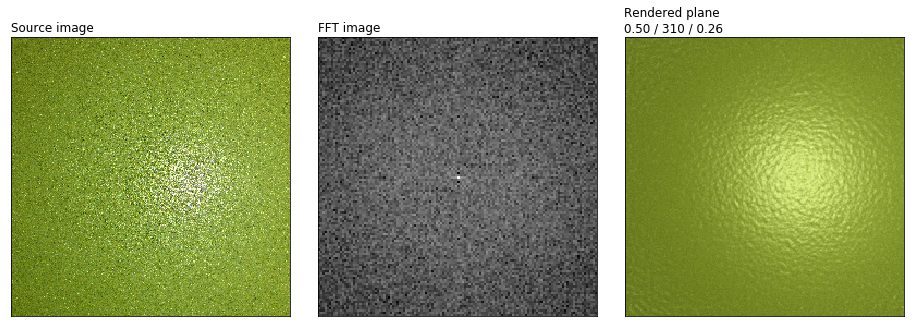

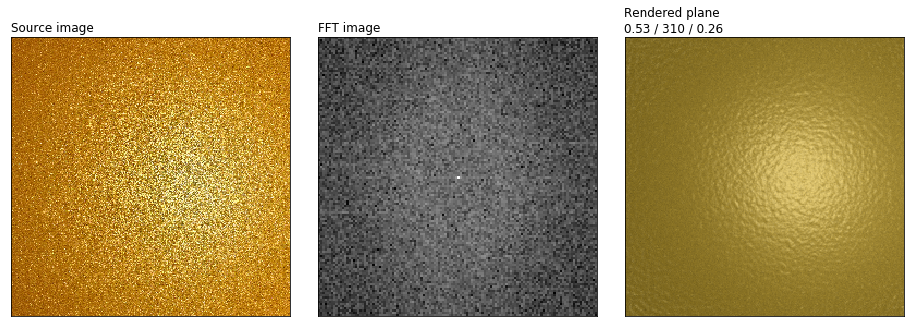

...

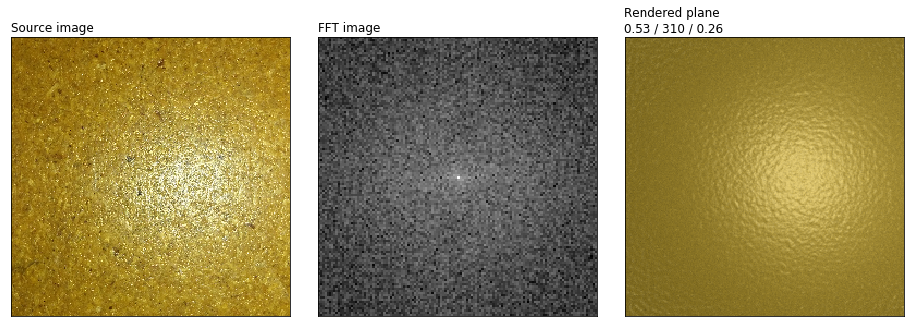

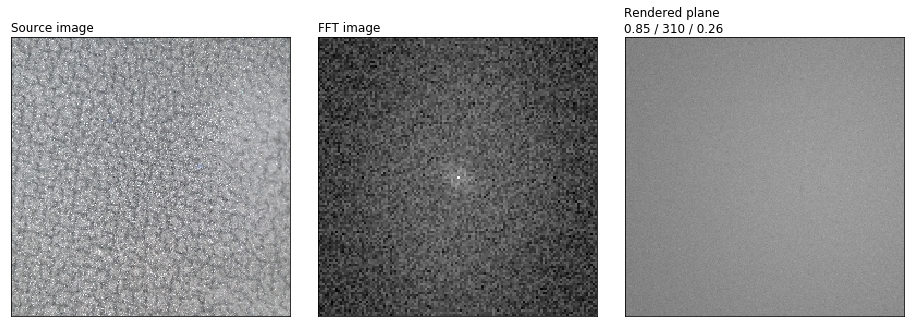

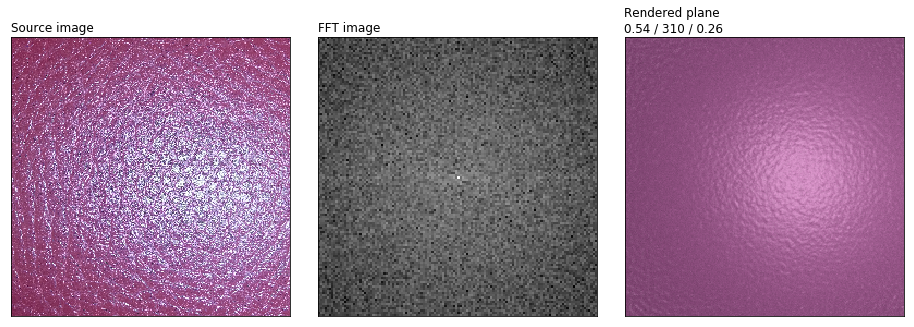

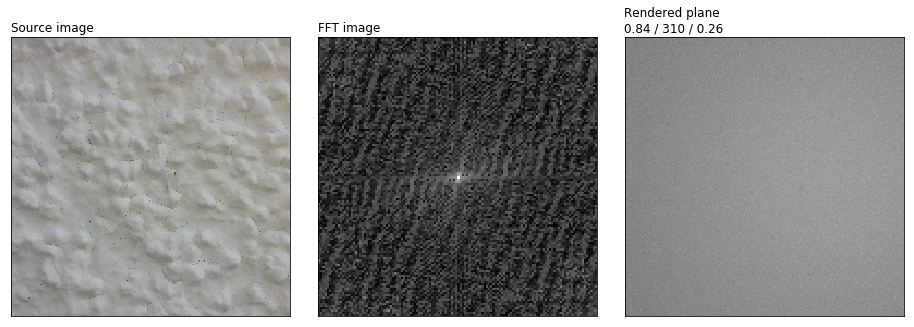

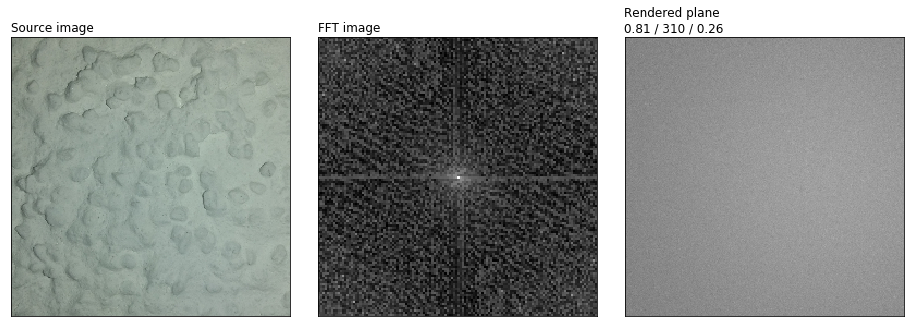

In [13]:
def plot_visualize(k, img):
    fig = plt.figure(figsize=(16,6))
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
       
    # Real images
    img_name = './real_samples/im{}.jpg'.format(str(k))
    im = Image.open(img_name)
    im = im.resize((256,256))
    im = np.asarray(im)/255
    ax = fig.add_subplot(131)
    ax.set_title('Source image', loc='left')
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # FFT of real images
    ax = fig.add_subplot(132)
    ax.set_title('FFT image', loc='left')
    ax.imshow(x_real_scale[k], cmap=plt.cm.gray)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Rendered planes
    rou_val = settings[k,3]
    scale = settings[k,4]
    depth = settings[k,5]
    ax = fig.add_subplot(133)
    ax.set_title('Rendered plane\n{:.2f} / {:.0f} / {:.2f}'.format(rou_val, scale, depth), loc='left')
    ax.imshow(img)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Rendered monkeys
    #ax = fig.add_subplot(133)
    #ax.imshow(img)
    #ax.set_title('Simulated PBR', loc='left')
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
    
    plt.show()
    
for k, img in enumerate(imgs):
    plot_visualize(k, img)